<a href="https://colab.research.google.com/github/yangyang1598/Yolo_training/blob/main/RCcar_Yolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Custom Yolo - 표지판 인식 실습

In [ ]:
import pandas as pd

## 데이터셋
---

### GTSRB - German Traffic Sign Recognition Benchmark

![](https://production-media.paperswithcode.com/datasets/GTSRB-0000000633-9ce3c5f6_Dki5Rsf.jpg)

* 필요데이터
  * Train.csv
  * Train.zip

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
# drive.mount('/content/drive/yolo_traffic_sign')

Mounted at /gdrive


In [ ]:
!ls /gdrive/MyDrive/yolo_traffic_sign

'TrafficCustomYolo (1).ipynb'   Train.csv   Train.zip


## YOLO Format 제작
---

원본 데이터의 csv 파일을 욜로 포멧 파일로 변환합니다.

욜로 포멧에는 아래와 같은 값들이 필요합니다.

* ClassID
* Center X
* Center Y
* Width
* Height

In [ ]:
annot = pd.read_csv('/gdrive/MyDrive/yolo_traffic_sign/Train.csv')
annot.head()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path
0,27,26,5,5,22,20,20,Train/20/00020_00000_00000.png
1,28,27,5,6,23,22,20,Train/20/00020_00000_00001.png
2,29,26,6,5,24,21,20,Train/20/00020_00000_00002.png
3,28,27,5,6,23,22,20,Train/20/00020_00000_00003.png
4,28,26,5,5,23,21,20,Train/20/00020_00000_00004.png


* 클래스 값 초기화

In [ ]:
annot['Categoryid'] = 0
annot.head()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path,Categoryid
0,27,26,5,5,22,20,20,Train/20/00020_00000_00000.png,0
1,28,27,5,6,23,22,20,Train/20/00020_00000_00001.png,0
2,29,26,6,5,24,21,20,Train/20/00020_00000_00002.png,0
3,28,27,5,6,23,22,20,Train/20/00020_00000_00003.png,0
4,28,26,5,5,23,21,20,Train/20/00020_00000_00004.png,0


* 클래스 묶기

```
Prohibitory = [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 15, 16]
Danger = [11, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]
Mandatory = [33, 34, 35, 36, 37, 38, 39, 40]
Other = [6, 12, 13, 14, 17, 32, 41, 42]

```



In [ ]:
class_names=['Prohibitory','Danger','Mandatory','Other']

In [ ]:
Prohibitory = [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 15, 16]
Danger = [11, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]
Mandatory = [33, 34, 35, 36, 37, 38, 39, 40]
Other = [6, 12, 13, 14, 17, 32, 41, 42]

In [ ]:
# ClassId 가 Prohibitory 값에 속하면 Categoryi d를 0 으로
# ClassId 가 Danger 값에 속하면 Categoryid 를 1 으로
# ClassId 가 Mandatory 값에 속하면 Categoryid 를 2 으로
# ClassId 가 Other 값에 속하면 Categoryid 를 3 으로

In [ ]:
annot.loc[annot['ClassId'].isin(Prohibitory), 'Categoryid'] = 0
annot.loc[annot['ClassId'].isin(Danger), 'Categoryid'] = 1
annot.loc[annot['ClassId'].isin(Mandatory), 'Categoryid'] = 2
annot.loc[annot['ClassId'].isin(Other), 'Categoryid'] = 3

In [ ]:
annot.head()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path,Categoryid
0,27,26,5,5,22,20,20,Train/20/00020_00000_00000.png,1
1,28,27,5,6,23,22,20,Train/20/00020_00000_00001.png,1
2,29,26,6,5,24,21,20,Train/20/00020_00000_00002.png,1
3,28,27,5,6,23,22,20,Train/20/00020_00000_00003.png,1
4,28,26,5,5,23,21,20,Train/20/00020_00000_00004.png,1


* 상대적 위치 구하기
  * center X : 네모박스 중앙 X 좌표값
  * center Y : 네모박스 중앙 Y 좌표값
  * width : 네모박스의 가로 사이즈
  * height : 네모박스의 세로 사이즈

In [ ]:
annot['centerX'] = (annot['Roi.X1'] + annot['Roi.X2']) / 2
annot['centerY'] = (annot['Roi.Y1'] + annot['Roi.Y2']) / 2
annot['width']=(annot['Roi.X2']+annot['Roi.X1'])/ 2
annot['height']=(annot['Roi.Y2']+annot['Roi.Y1'])/ 2

annot['centerX'] = annot['centerX'] / annot['Width']
annot['centerY'] = annot['centerY'] / annot['Height']
annot['width'] = annot['width'] / annot['Width']
annot['height'] = annot['height'] / annot['Height']

* 필요없는 열 제거

## 만들어야 할것
----
1. 이미지-정답 세트
2. `.txt` (train, test 각각)
3. `.names`
4. `.data`
5. `.cfg`

### 1. 이미지-정답 세트

* 이미지 데이터셋 확보

In [ ]:
!cp /gdrive/MyDrive/yolo_traffic_sign/Train.zip .

In [ ]:
!unzip Train.zip  -d Train

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: Train/5/00005_00053_00014.png  
  inflating: Train/5/00005_00053_00015.png  
  inflating: Train/5/00005_00053_00016.png  
  inflating: Train/5/00005_00053_00017.png  
  inflating: Train/5/00005_00053_00018.png  
  inflating: Train/5/00005_00053_00019.png  
  inflating: Train/5/00005_00053_00020.png  
  inflating: Train/5/00005_00053_00021.png  
  inflating: Train/5/00005_00053_00022.png  
  inflating: Train/5/00005_00053_00023.png  
  inflating: Train/5/00005_00053_00024.png  
  inflating: Train/5/00005_00053_00025.png  
  inflating: Train/5/00005_00053_00026.png  
  inflating: Train/5/00005_00053_00027.png  
  inflating: Train/5/00005_00053_00028.png  
  inflating: Train/5/00005_00053_00029.png  
  inflating: Train/5/00005_00054_00000.png  
  inflating: Train/5/00005_00054_00001.png  
  inflating: Train/5/00005_00054_00002.png  
  inflating: Train/5/00005_00054_00003.png  
  inflating: Train/5/00005_00054_00004.png  
  inflating: Train/


* 정답 데이터셋 생성


In [ ]:
paths = []
for idx, data in annot.iterrows():
  
  txt_file = data['Path'].split('.')[0] +'.txt'
  categoryid = str(data['Categoryid']) + ' ' 
  centerx = str(data['centerX']) + ' ' 
  centery = str(data['centerY']) +' '
  width = str(data['width']) + ' ' 
  height = str(data['height'])
  line = categoryid+centerx+centery+width+height 
  with open(txt_file, 'w') as txt:
    txt.write(line)
  img_path = data['Path'] + '\n'
  paths.append(img_path)
  print(idx, txt_file, line)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
34209 Train/35/00035_00000_00010.txt 2 0.5 0.5108695652173914 0.5 0.5108695652173914
34210 Train/35/00035_00000_00011.txt 2 0.5 0.5104166666666666 0.5 0.5104166666666666
34211 Train/35/00035_00000_00012.txt 2 0.5 0.5 0.5 0.5
34212 Train/35/00035_00000_00013.txt 2 0.5 0.5102040816326531 0.5 0.5102040816326531
34213 Train/35/00035_00000_00014.txt 2 0.5 0.5 0.5 0.5
34214 Train/35/00035_00000_00015.txt 2 0.5 0.5 0.5 0.5
34215 Train/35/00035_00000_00016.txt 2 0.509090909090909 0.5 0.509090909090909 0.5
34216 Train/35/00035_00000_00017.txt 2 0.49107142857142855 0.5089285714285714 0.49107142857142855 0.5089285714285714
34217 Train/35/00035_00000_00018.txt 2 0.5 0.5084745762711864 0.5 0.5084745762711864
34218 Train/35/00035_00000_00019.txt 2 0.5083333333333333 0.5 0.5083333333333333 0.5
34219 Train/35/00035_00000_00020.txt 2 0.5 0.5 0.5 0.5
34220 Train/35/00035_00000_00021.txt 2 0.5 0.5 0.5 0.5
34221 Train/35/00035_00000_00022.txt 2 0.5 0.5069444444444444 0.

 ### *숙제1: 코드 리뷰*
annot.iterrows():행에 대해 순환 반복, 행 단위로 끊어서 데이터 내용 
 - ex) 
 
 
 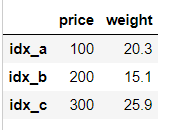    ->  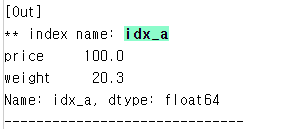


-------------------------------------------------


txt_file = data['Path'].split('.')[0] +'.txt'
 :각 사진에 대한 txt파일을 만들기 위한 txt파일명 생성


-------------------------------------------------

 line = categoryid+centerx+centery+width+height

 with open(txt_file, 'w') as txt:

  txt.write(line) 
  : 각 파일에 대한 categoryid,centerx,centery,width,height을 line 변수에 값을 할당하고 이를 생성 txt파일에 추가한다.


----------------------------------------------------


  img_path = data['Path'] + '\n'
  paths.append(img_path)

  :paths에 새로 생성한 이미지 경로 추가

----------------------------------------------------


### 2. `.txt` (train, test 각각) 

* train-test 분리

In [ ]:
len(paths)
train_ratio=0.8
print("total dataset:",len(paths))
print("train ratio:",train_ratio)
n_train=int(len(paths)*train_ratio)
paths_train=paths[:n_train]
paths_test=paths[n_train:]
print('* n train:',len(paths_train))
print("* n test:",len(paths_test))


total dataset: 39209
train ratio: 0.8
* n train: 31367
* n test: 7842


* `train.txt` 생성

In [ ]:
with open('train.txt','w') as train_txt:
  for path in paths_train:
    train_txt.write(path)
  print("* create train.txt")


* create train.txt


* `test.txt` 생성

In [ ]:
with open('test.txt','w') as test_txt:
  for path in paths_test:
    test_txt.write(path)
  print("* create test.txt")
  

* create test.txt


### 3. `.names`
클래스의 이름이 들어있습니다.

In [ ]:
with open('classes.names','w') as names:
  for class_name in class_names:
    names.write(class_name+"\n")
  print("* create 'class_name'")

* create 'class_name'


### 4. `.data`

학습에 대한 기본적인 정보가 들어있습니다.

* classes : 클래스 개수
* train: 훈련 데이터 정답값 (txt 파일)
* valid: 테스트 데이터 정답값 (txt 파일)
* names: 클래스 이름 (names 파일)
* backup: 백업 폴더

In [ ]:
with open('traffic.data','w') as data:
  data.write('classes=4\n')
  data.write('train=train.txt\n')
  data.write('valid=test.txt\n')
  data.write('names=classes.names\n')
  data.write('backup= backup')
  print("* create 'traffic.data'")

* create 'traffic.data'


* backup폴더 생성

In [ ]:
mkdir backup


### 5. `.cfg`
* train

```
[net]
batch=32
subdivisions=16
width=416
height=416
```

* test

```
[net]
batch=1
subdivisions=1
width=416
height=416
```


### *숙제 2 .cfg 파일 설명*
[net] : 네트워크 전반적인 설정을 구성해주는 block

  - 보통 괄호 내 내용은 하나의 네트워크적인 의미를 가지고있다.

  - 만일 cfg파일 내에 [convolution], [convolution], [convolution], [shortcut]가 있다면 3개의 convolution layer와 1개의 shortcut으로 구성된 것을 의미함

------------------------
 
각각의 내용은 보이는 내용과 같이

batch:배치 사이즈, 해당 경우 64->32로 변경하였는데 배치사이즈가 큰 경우 데이터 학습속도가 느려지고, 메모리 부족등의 문제가 발생하므로 변경하였다.

subdivisions: mini-batch, 배치를 몇개의 단위로 분할할 것인지

width,height: kernel의 너비와 높이


## 모델 가져오기
---


https://pjreddie.com/darknet/yolo/

* `darknet` : 모델 구조
* `weight` : pre-train된 가중치 값

### 1. `darknet` 

In [ ]:
rm -rf ./darknet

In [ ]:
from google.colab import files
files.upload()

Saving darknet to darknet


{'darknet': b'\x7fELF\x02\x01\x01\x03\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00>\x00\x01\x00\x00\x00\xb0\xa3\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x008\xff0\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x008\x00\t\x00@\x00(\x00\'\x00\x06\x00\x00\x00\x04\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x00\xf8\x01\x00\x00\x00\x00\x00\x00\xf8\x01\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x04\x00\x00\x008\x02\x00\x00\x00\x00\x00\x008\x02\x00\x00\x00\x00\x00\x008\x02\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~2/\x00\x00\x00\x00\x00~2/\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x00\x00\x01\x00\x00\x00\x06\x00\x00\x00\x98=/\x00\x00\x00\x00\x00\x98=O\x00\x00\x00\x00\x00\x98=O\x00\x00\x00\x00\x00h\x19\x00\x00\x00\x00\x0

In [ ]:
! chmod +x darknet

### 2. `weight`

```
!wget https://pjreddie.com/media/files/darknet53.conv.74
```

In [ ]:
!wget https://pjreddie.com/media/files/darknet53.conv.74

--2022-01-17 03:06:07--  https://pjreddie.com/media/files/darknet53.conv.74
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 162482580 (155M) [application/octet-stream]
Saving to: ‘darknet53.conv.74’

darknet53.conv.74   100%[===================>] 154.96M  50.1MB/s    in 3.1s    

2022-01-17 03:06:11 (50.1 MB/s) - ‘darknet53.conv.74’ saved [162482580/162482580]



## 훈련
---


In [ ]:
#yolo homepage 복사본
! ./darknet detector train traffic.data traffic-train-yolo.cfg darknet53.conv.74 -dont_show


traffic-train-yolo
layer     filters    size              input                output
   0 conv     32  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  32 0.299 BF
   1 conv     64  3 x 3 / 2   416 x 416 x  32   ->   208 x 208 x  64 1.595 BF
   2 conv     32  1 x 1 / 1   208 x 208 x  64   ->   208 x 208 x  32 0.177 BF
   3 conv     64  3 x 3 / 1   208 x 208 x  32   ->   208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1
   5 conv    128  3 x 3 / 2   208 x 208 x  64   ->   104 x 104 x 128 1.595 BF
   6 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64 0.177 BF
   7 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5
   9 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64 0.177 BF
  10 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128 1.595 BF
  11 Shortcut Layer: 8
  12 conv    256  3 x 3 / 2   104 x 104 x 128   ->    52 x  52 x 256 1.595 BF
  13 conv    128  1 x 1 / 1    52 x  52 x 256   ->    52 x  52 x 